**Pressione SHIFT+ENTER para executar a célula**

# Alegrete

Este notebook fornece algumas visualizações para o trabalho de regressão linear. Para conseguir usar, implemente as funções no seu `alegrete.py` e tenha as bibliotecas `numpy` e `matplotlib` instaladas.

O notebook usa um conjunto de dados sintetico. Adapte-o para carregar e usar os dados do `alegrete.csv`.

### Imports das bibliotecas de plot e da solucao implementada

In [1]:
%matplotlib inline
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import alegrete

([1.231098258064516, -20.45773831367162, 322.056597815532, -5121.417483134331, 81356.64000686648, -1292514.0694875368, 20534040.526388295, -326222407.0319845, 5182665070.628939, -82336518681.72156, 1308072625739.9814, -20781228325285.332, 330149444464468.0, -5245053563440282.0, 8.332767885762178e+16, -1.3238190954230492e+18, 2.1031391026757263e+19, -3.341237560703231e+20, 5.308193082830709e+21, -8.433077053845098e+22, 1.339755119799902e+24, -2.1284565166064006e+25, 3.381459101093697e+26, -5.372092670514181e+27, 8.534593735366473e+28, -1.355882980715314e+30, 2.1540786994643084e+31, -3.422164825048491e+32, 5.436761476129715e+33, -8.637332466272828e+34, 1.3722049874816077e+36, -2.1800093200324904e+37, 3.463360561129151e+38, -5.502208759458913e+39, 8.741307957493211e+40, -1.3887234772104198e+42, 2.2062520912585012e+43, -3.505052208060986e+44, 5.568443891751869e+45, -8.846535097045602e+46, 1.4054408151473391e+48, -2.2328107707860422e+49, 3.5472457355776393e+50, -5.635476357068997e+51, 8.953

### Visualizacao dos dados

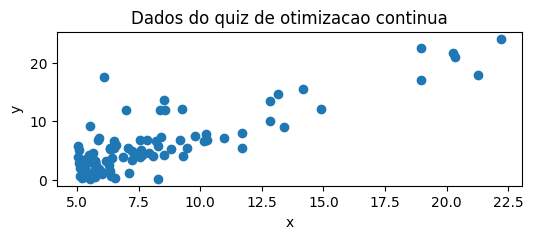

In [2]:
# dataset do Quiz de Otimizacao Continua -- troque para carregar o alegrete.csv
quiz_data = np.genfromtxt('alegrete.csv', delimiter=',')

#Gráfico dos dados
plt.figure(figsize=(6, 2))
plt.scatter(quiz_data[:,0], quiz_data[:,1])
plt.xlabel('x')
plt.ylabel('y')
plt.title('Dados do quiz de otimizacao continua')
plt.show()

### Execucao da regressao linear e calculo do EQM por epoca/iteracao

EQM final: 8.529433040552068


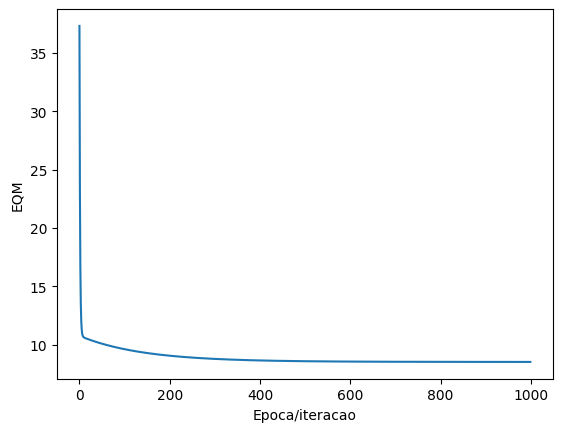

In [3]:
theta_0s, theta_1s = alegrete.fit(
    quiz_data, theta_0=0, theta_1=0, 
    alpha=0.1, num_iterations=1000
)

# valores finais de theta0 e theta1
final_th0, final_th1 = theta_0s[-1], theta_1s[-1]

mse_list = [alegrete.compute_mse(th0, th1, quiz_data) for th0, th1 in zip(theta_0s, theta_1s)]
print(f"EQM final: {mse_list[-1]}")


plt.plot(mse_list)
plt.xlabel('Epoca/iteracao')
plt.ylabel('EQM')
plt.show()

### Plot da curva final

Curva encontrada: 1.1509374496448106*x + -3.352365636507716


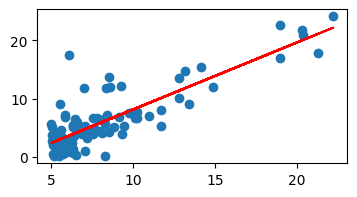

In [4]:
theta_0s, theta_1s = alegrete.fit(
    quiz_data, theta_0=0, theta_1=0, 
    alpha=0.01, num_iterations=1000
)

# valores finais de theta0 e theta1
final_th0, final_th1 = theta_0s[-1], theta_1s[-1]

#Imprimir parâmetros otimizados
print (f'Curva encontrada: {final_th1}*x + {final_th0}')

#plota os dados
plt.figure(figsize=(4, 2))
plt.scatter(quiz_data[:,0], quiz_data[:,1])

# plota a curva de ajuste
pred = final_th1*quiz_data[:,0] + final_th0
plt.plot(quiz_data[:,0], pred, c='r')
plt.show()




### Progresso da descida do gradiente com o número de iterações

Execute a celula e use os controles abaixo do grafico para visualizar o progresso do seu ajuste

Pode aparecer um grafico "extra" abaixo da animacao, apenas ignore.

C:\Users\Alber\AppData\Local\Temp\ipykernel_17712\335828031.py:18: UserWarning: You passed in an explicit save_count=50 which is being ignored in favor of frames=1000.
  ani = animation.FuncAnimation(fig, animate, frames=len(theta_0s), interval=20, save_count=50)


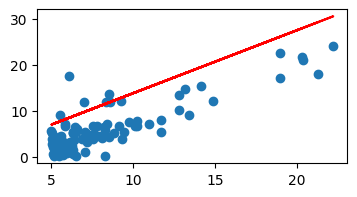

In [5]:
fig = plt.figure(figsize=(4, 2))
ax = fig.add_subplot(111)

# conjunto de dados
ax.scatter(quiz_data[:,0], quiz_data[:,1])

# linha com os valores iniciais dos parametros
pred = theta_1s[0]*quiz_data[:,0] + theta_0s[0]
line, = ax.plot(quiz_data[:,0], pred, '-',c='r')

# funcao que atualiza a linha a cada passo
def animate(i):
    pred = theta_1s[i] * quiz_data[:,0] + theta_0s[i]
    line.set_ydata(pred)
    return line,

# mude interval para trocar a velocidade da animacao
ani = animation.FuncAnimation(fig, animate, frames=len(theta_0s), interval=20, save_count=50)
HTML(ani.to_jshtml())